In [1]:
from IPython.display import display
from IPython.core.display import HTML
%load_ext autoreload
%load_ext time
%autoreload 2
%autosave 60
%matplotlib inline

display(HTML("<style>.container { width:80% !important; }</style>"))

The time module is not an IPython extension.


Autosaving every 60 seconds


In [2]:
import pandas as pd
import numpy as np
import folium
import geojson
import geopandas
import h5py
import osmnx as ox
import networkx as nx
import seaborn as sns
from pathlib import Path
from matplotlib import pyplot as plt
from datetime import datetime, timedelta

from exploration_utils import plot_counter, plot_counters, plot_locations, inspect_diff_area, plot_scatters
from exploration_utils import plot_speed_dayline, plot_flow_dayline, compute_highway_stats

RELEASE_PATH = Path('/private/data/mets10/release20221026_residential_unclassified/2022')
COUNTER_PATH = Path('/private/data/mets10/loop_counters')

DAY = '2021-06-01'

/usr/local/Caskroom/miniconda/base/envs/t4c/lib/python3.8/site-packages/geopandas/_compat.py:123: UserWarning: The Shapely GEOS version (3.10.3-CAPI-1.16.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


### Load road graph

In [84]:
edges_df = geopandas.read_parquet(RELEASE_PATH / 'road_graph' / 'madrid' / 'road_graph_edges.parquet')
edges_df

,u,v,osmid,speed_kph,maxspeed,highway,oneway,lanes,tunnel,length_meters,geometry,gkey,gkey_duplicate
0,171946,26513145,807334397,50.0,50,tertiary,True,4,nan,41.093,"LINESTRING (-3.68445 40.42126, -3.68442 40.42163)",4149903437235940830,False
1,171951,1209331009,104864843,76.6,nan,residential,True,nan,nan,18.733,"LINESTRING (-3.68899 40.41736, -3.68885 40.41749)",-1285903886261759241,False
2,171951,26486636,553113575,50.0,50,tertiary,True,3,nan,81.552,"LINESTRING (-3.68899 40.41736, -3.68903 40.416...",-7545555843203362691,False
3,171952,26486617,317302445,44.8,nan,tertiary,True,3,nan,26.251,"LINESTRING (-3.68898 40.41499, -3.68897 40.41475)",1119449766691591925,False
4,171953,2681222064,28401583,76.6,nan,residential,True,nan,nan,18.835,"LINESTRING (-3.68890 40.41277, -3.68876 40.41290)",6423810957474462986,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
143405,10126071725,10126071723,1106582068,40.0,40,unclassified,True,1,nan,53.446,"LINESTRING (-3.59927 40.23730, -3.59883 40.237...",-7853174484249498746,False
143406,10129032779,1685000366,1106946491,76.6,nan,residential,True,nan,nan,35.812,"LINESTRING (-3.53238 40.37933, -3.53253 40.379...",-7202250319718064096,False
143407,10129032779,1685000369,1106946492,76.6,nan,residential,False,nan,nan,58.294,"LINESTRING (-3.53238 40.37933, -3.53180 40.379...",6432337982541173968,False
143408,10130105875,26501348,1107071893,50.0,50,residential,False,2,nan,6.544,"LINESTRING (-3.70613 40.40342, -3.70620 40.40340)",-5349421036130270824,False


### Load loop counter locations matched

In [4]:
counters_assigned_df = geopandas.read_parquet(RELEASE_PATH / 'road_graph' / 'madrid' / 'counters_matched.parquet')
print(len(counters_assigned_df))
counters_assigned_df = counters_assigned_df[counters_assigned_df['way'] != -1]
counters_assigned_df

4412


,id,lat,lon,heading,name,ways,way_dists,way,way_dist,u,v,geometry
0,1001,40.409729,-3.740786,62.428189,,"[(21702026, 315518315, 0), (499633486, 3155183...","[1.4433022167418321, 6.839383661400331, 12.080...",44618925,1.443302,21702026,315518315,POINT (-3.74079 40.40973)
1,1002,40.408030,-3.743760,66.768303,,"[(21702026, 315518315, 0), (21702026, 31551770...","[2.209060687018068, 8.790978137683027, 14.2283...",44618925,2.209061,21702026,315518315,POINT (-3.74376 40.40803)
2,1003,40.406824,-3.746834,67.775190,,"[(255883289, 21702026, 0), (1425927492, 255883...","[1.9701542307576267, 16.24507476725276, 28.663...",44618924,1.970154,255883289,21702026,POINT (-3.74683 40.40682)
3,1006,40.411894,-3.736324,69.955706,,"[(305399719, 305399717, 0), (315518315, 217020...","[2.76047591158687, 8.549680213918583, 18.87443...",28701928,2.760476,305399719,305399717,POINT (-3.73632 40.41189)
4,1009,40.416234,-3.724909,68.506837,,"[(315518315, 21702049, 0), (305399711, 3155192...","[1.1733859763193506, 4.8042663391643226, 12.68...","[4085376, 194757411]",1.173386,315518315,21702049,POINT (-3.72491 40.41623)
...,...,...,...,...,...,...,...,...,...,...,...,...
4407,10916,40.375355,-3.655874,288.299315,,"[(307712572, 316782662, 0), (316782661, 307712...","[2.098968282556398, 7.46277580928028, 38.47938...","[818687835, 72133557, 27875198, 261435166]",2.098968,307712572,316782662,POINT (-3.65587 40.37535)
4408,10917,40.379500,-3.671742,56.643724,,"[(306044017, 306043013, 0), (306043013, 306044...","[2.0372134883845705, 2.0372134883845705, 15.89...",172906541,2.037213,306044017,306043013,POINT (-3.67174 40.37950)
4409,10918,40.379595,-3.670096,312.224245,,"[(306043019, 307701118, 0), (307701118, 306043...","[0.909355212130055, 0.909355212130055]",27875174,0.909355,307701118,306043019,POINT (-3.67010 40.37960)
4410,10919,40.380650,-3.670044,234.875019,,"[(307700924, 2237921393, 0), (2237921393, 3077...","[2.3391319376665964, 2.3391319376665964, 17.70...",72136968,2.339132,2237921393,307700924,POINT (-3.67004 40.38065)


In [5]:
compute_highway_stats(counters_assigned_df, edges_df)

,count,share,share_full
highway,,,
motorway,440,10 %,9.959258
primary,814,18 %,18.424627
residential,1350,31 %,30.556813
secondary,656,15 %,14.848348
tertiary,1109,25 %,25.101856
trunk,38,1 %,0.860118
unclassified,11,0 %,0.248981


### Load loop counter values

In [6]:
def t_from_time_bin(tb, do_floor=True):
    h, m = tb[10:].split(':')
    t = int(h) * 4 + int(float(m) / 15)
    if not do_floor:
        return t
    # T4c speed is floored, counters seem ceiled --> subtract 1
    t -= 1
    if t < 0:
        t = 95
    return t

def day_from_time_bin(tb, do_floor=True):
    if do_floor and t_from_time_bin(tb) == 95:
        d = datetime.strptime(tb, '%Y-%m-%d %H:%M') - timedelta(days=1)
        return d.strftime('%Y-%m-%d')
    return tb[:10]

def convert_counter_times(df, do_floor=True):
    df['t'] = [t_from_time_bin(tb, do_floor) for tb in df['time_bin']]
    df['day'] = [day_from_time_bin(tb, do_floor) for tb in df['time_bin']]
    return df

def convert_all_counters(output_path, m30_only=True):
    dfs = []
    loop_counter_files = sorted(list((DATA_PATH / 'loop_counters' / 'madrid' / 'all').glob('*.parquet')))
    for f in loop_counter_files:
        print(f)
        df = pd.read_parquet(f)
        if m30_only:
            df = df[df['type'] == 'M30']
        dfs.append(df)
    df = pd.concat(dfs)
    df = convert_counter_times(df, do_floor=False)
    df.to_parquet(output_path, compression="snappy")
    return df

# all_m30_df = convert_all_counters(DATA_PATH / 'loop_counters' / 'madrid' / 'm30_madrid_202106-202112.parquet')
# all_m30_df = pd.read_parquet(DATA_PATH / 'loop_counters' / 'madrid' / 'm30_madrid_202106-202112.parquet')
# all_m30_df

In [7]:
counter_df = pd.read_parquet(COUNTER_PATH / 'madrid' / 'all' / f'counters_{DAY[:7]}.parquet')
counter_df = counter_df.rename(columns={'speed_avg': 'speed_counter'})
counter_df = convert_counter_times(counter_df)
counter_df

,id,lat,lon,heading,time_bin,type,volume,occupation,congestion_level,speed_counter,t,day
0,1001,40.409729,-3.740786,62.428189,2021-06-01 00:00,M30,372,1.0,0.0,51.0,95,2021-05-31
1,1001,40.409729,-3.740786,62.428189,2021-06-01 00:15,M30,360,1.0,0.0,63.0,0,2021-06-01
2,1001,40.409729,-3.740786,62.428189,2021-06-01 00:30,M30,228,1.0,0.0,58.0,1,2021-06-01
3,1001,40.409729,-3.740786,62.428189,2021-06-01 00:45,M30,240,1.0,0.0,60.0,2,2021-06-01
4,1001,40.409729,-3.740786,62.428189,2021-06-01 01:00,M30,120,NaN,0.0,60.0,3,2021-06-01
...,...,...,...,...,...,...,...,...,...,...,...,...
11577332,10814,40.399327,-3.687896,93.335224,2021-06-30 22:45,URB,285,3.0,12.0,0.0,90,2021-06-30
11577333,10814,40.399327,-3.687896,93.335224,2021-06-30 23:00,URB,228,2.0,9.0,0.0,91,2021-06-30
11577334,10814,40.399327,-3.687896,93.335224,2021-06-30 23:15,URB,228,2.0,10.0,0.0,92,2021-06-30
11577335,10814,40.399327,-3.687896,93.335224,2021-06-30 23:30,URB,256,2.0,11.0,0.0,93,2021-06-30


### Load T4c speed values

In [20]:
speed_df = pd.read_parquet(RELEASE_PATH / 'speed_classes' / 'madrid' / f'speed_classes_{DAY}.parquet')
speed_df = speed_df.rename(columns={'median_speed_kph': 'speed_probes'})
speed_df = speed_df.rename(columns={'volume': 'volume_probes'})
speed_df

,u,v,gkey,osmid,day,t,volume_class,volume_probes,speed_probes,mean_speed_kph,std_speed_kph,free_flow_kph
0,171946,26513145,4149903437235940830,807334397,2021-06-01,0,5,18.0,22.980392,22.980392,5.882353,26.823529
1,171946,26513145,4149903437235940830,807334397,2021-06-01,1,5,16.0,29.372549,29.372549,9.372549,26.823529
2,171946,26513145,4149903437235940830,807334397,2021-06-01,2,5,9.0,31.529412,31.529412,0.000000,26.823529
3,171946,26513145,4149903437235940830,807334397,2021-06-01,4,5,6.0,27.058824,27.058824,8.235294,26.823529
4,171946,26513145,4149903437235940830,807334397,2021-06-01,5,5,12.0,28.627451,28.627451,8.392157,26.823529
...,...,...,...,...,...,...,...,...,...,...,...,...
4027622,10130105875,26495425,4513636091640621014,1107071895,2021-06-01,80,5,9.0,12.000000,12.000000,0.000000,23.294118
4027623,10130105875,26495425,4513636091640621014,1107071895,2021-06-01,83,3,4.0,12.941176,12.941176,0.000000,23.294118
4027624,10130105875,26495425,4513636091640621014,1107071895,2021-06-01,85,5,6.0,11.294118,11.294118,0.000000,23.294118
4027625,10130105875,26495425,4513636091640621014,1107071895,2021-06-01,86,5,6.0,2.823529,2.823529,0.000000,23.294118


## Compare Speed Values

In [21]:
counter_speed_df = counter_df[counter_df['type'] == 'M30']
counter_speed_df

,id,lat,lon,heading,time_bin,type,volume,occupation,congestion_level,speed_counter,t,day
0,1001,40.409729,-3.740786,62.428189,2021-06-01 00:00,M30,372,1.0,0.0,51.0,95,2021-05-31
1,1001,40.409729,-3.740786,62.428189,2021-06-01 00:15,M30,360,1.0,0.0,63.0,0,2021-06-01
2,1001,40.409729,-3.740786,62.428189,2021-06-01 00:30,M30,228,1.0,0.0,58.0,1,2021-06-01
3,1001,40.409729,-3.740786,62.428189,2021-06-01 00:45,M30,240,1.0,0.0,60.0,2,2021-06-01
4,1001,40.409729,-3.740786,62.428189,2021-06-01 01:00,M30,120,NaN,0.0,60.0,3,2021-06-01
...,...,...,...,...,...,...,...,...,...,...,...,...
11275993,10662,40.419298,-3.658963,199.072758,2021-06-30 22:45,M30,395,2.0,25.0,85.0,90,2021-06-30
11275994,10662,40.419298,-3.658963,199.072758,2021-06-30 23:00,M30,319,2.0,19.0,83.0,91,2021-06-30
11275995,10662,40.419298,-3.658963,199.072758,2021-06-30 23:15,M30,276,2.0,16.0,83.0,92,2021-06-30
11275996,10662,40.419298,-3.658963,199.072758,2021-06-30 23:30,M30,336,2.0,20.0,84.0,93,2021-06-30


In [22]:
counter_speeds_oneday = counter_speed_df[counter_speed_df['day'] == DAY].merge(
    counters_assigned_df[['id', 'way', 'u', 'v']], on=['id'])
counter_speeds_oneday

,id,lat,lon,heading,time_bin,type,volume,occupation,congestion_level,speed_counter,t,day,way,u,v
0,1001,40.409729,-3.740786,62.428189,2021-06-01 00:15,M30,360,1.0,0.0,63.0,0,2021-06-01,44618925,21702026,315518315
1,1001,40.409729,-3.740786,62.428189,2021-06-01 00:30,M30,228,1.0,0.0,58.0,1,2021-06-01,44618925,21702026,315518315
2,1001,40.409729,-3.740786,62.428189,2021-06-01 00:45,M30,240,1.0,0.0,60.0,2,2021-06-01,44618925,21702026,315518315
3,1001,40.409729,-3.740786,62.428189,2021-06-01 01:00,M30,120,NaN,0.0,60.0,3,2021-06-01,44618925,21702026,315518315
4,1001,40.409729,-3.740786,62.428189,2021-06-01 01:15,M30,72,NaN,0.0,34.0,4,2021-06-01,44618925,21702026,315518315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39454,10662,40.419298,-3.658963,199.072758,2021-06-01 23:00,M30,288,2.0,17.0,87.0,91,2021-06-01,103599034,25943343,21473261
39455,10662,40.419298,-3.658963,199.072758,2021-06-01 23:15,M30,172,2.0,11.0,81.0,92,2021-06-01,103599034,25943343,21473261
39456,10662,40.419298,-3.658963,199.072758,2021-06-01 23:30,M30,248,1.0,15.0,85.0,93,2021-06-01,103599034,25943343,21473261
39457,10662,40.419298,-3.658963,199.072758,2021-06-01 23:45,M30,147,1.0,9.0,74.0,94,2021-06-01,103599034,25943343,21473261


In [23]:
speeds_merged = counter_speeds_oneday.merge(speed_df, on=['u', 'v', 't', 'day'])
speeds_merged

,id,lat,lon,heading,time_bin,type,volume,occupation,congestion_level,speed_counter,...,u,v,gkey,osmid,volume_class,volume_probes,speed_probes,mean_speed_kph,std_speed_kph,free_flow_kph
0,1001,40.409729,-3.740786,62.428189,2021-06-01 00:15,M30,360,1.0,0.0,63.0,...,21702026,315518315,5819012343314364083,44618925,5,76.0,54.823529,56.172549,5.559097,61.647059
1,1002,40.408030,-3.743760,66.768303,2021-06-01 00:15,M30,372,1.0,0.0,64.0,...,21702026,315518315,5819012343314364083,44618925,5,76.0,54.823529,56.172549,5.559097,61.647059
2,6794,40.408301,-3.743268,61.302136,2021-06-01 00:15,M30,325,0.0,6.0,66.0,...,21702026,315518315,5819012343314364083,44618925,5,76.0,54.823529,56.172549,5.559097,61.647059
3,1001,40.409729,-3.740786,62.428189,2021-06-01 00:30,M30,228,1.0,0.0,58.0,...,21702026,315518315,5819012343314364083,44618925,5,87.0,54.156863,51.364706,9.352983,61.647059
4,1002,40.408030,-3.743760,66.768303,2021-06-01 00:30,M30,372,2.0,0.0,61.0,...,21702026,315518315,5819012343314364083,44618925,5,87.0,54.156863,51.364706,9.352983,61.647059
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37324,10662,40.419298,-3.658963,199.072758,2021-06-01 23:00,M30,288,2.0,17.0,87.0,...,25943343,21473261,-7687982933720619339,103599034,5,75.0,78.431373,77.168627,8.080902,84.705882
37325,10662,40.419298,-3.658963,199.072758,2021-06-01 23:15,M30,172,2.0,11.0,81.0,...,25943343,21473261,-7687982933720619339,103599034,5,78.0,75.294118,70.545455,17.264472,84.705882
37326,10662,40.419298,-3.658963,199.072758,2021-06-01 23:30,M30,248,1.0,15.0,85.0,...,25943343,21473261,-7687982933720619339,103599034,5,77.0,81.019608,78.078431,12.655492,84.705882
37327,10662,40.419298,-3.658963,199.072758,2021-06-01 23:45,M30,147,1.0,9.0,74.0,...,25943343,21473261,-7687982933720619339,103599034,5,53.0,80.313725,78.831373,9.695682,84.705882


In [25]:
counters_speed_df = speeds_merged[['id', 'u', 'v', 'way']].groupby(by=['id', 'u', 'v', 'way']).count().reset_index()
compute_highway_stats(counters_speed_df, edges_df)

,count,share,share_full
highway,,,
motorway,345,85 %,85.396040
primary,16,4 %,3.960396
residential,18,4 %,4.455446
tertiary,4,1 %,0.990099
trunk,21,5 %,5.198020


In [24]:
speeds_merged = speeds_merged[speeds_merged['volume'] > 0]
speeds_merged['diff'] = (speeds_merged['speed_counter'] - speeds_merged['speed_probes']).abs()
speeds_merged

<ipython-input-24-a77ee79ec4d4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  speeds_merged['diff'] = (speeds_merged['speed_counter'] - speeds_merged['speed_probes']).abs()


,id,lat,lon,heading,time_bin,type,volume,occupation,congestion_level,speed_counter,...,v,gkey,osmid,volume_class,volume_probes,speed_probes,mean_speed_kph,std_speed_kph,free_flow_kph,diff
0,1001,40.409729,-3.740786,62.428189,2021-06-01 00:15,M30,360,1.0,0.0,63.0,...,315518315,5819012343314364083,44618925,5,76.0,54.823529,56.172549,5.559097,61.647059,8.176471
1,1002,40.408030,-3.743760,66.768303,2021-06-01 00:15,M30,372,1.0,0.0,64.0,...,315518315,5819012343314364083,44618925,5,76.0,54.823529,56.172549,5.559097,61.647059,9.176471
2,6794,40.408301,-3.743268,61.302136,2021-06-01 00:15,M30,325,0.0,6.0,66.0,...,315518315,5819012343314364083,44618925,5,76.0,54.823529,56.172549,5.559097,61.647059,11.176471
3,1001,40.409729,-3.740786,62.428189,2021-06-01 00:30,M30,228,1.0,0.0,58.0,...,315518315,5819012343314364083,44618925,5,87.0,54.156863,51.364706,9.352983,61.647059,3.843137
4,1002,40.408030,-3.743760,66.768303,2021-06-01 00:30,M30,372,2.0,0.0,61.0,...,315518315,5819012343314364083,44618925,5,87.0,54.156863,51.364706,9.352983,61.647059,6.843137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37324,10662,40.419298,-3.658963,199.072758,2021-06-01 23:00,M30,288,2.0,17.0,87.0,...,21473261,-7687982933720619339,103599034,5,75.0,78.431373,77.168627,8.080902,84.705882,8.568627
37325,10662,40.419298,-3.658963,199.072758,2021-06-01 23:15,M30,172,2.0,11.0,81.0,...,21473261,-7687982933720619339,103599034,5,78.0,75.294118,70.545455,17.264472,84.705882,5.705882
37326,10662,40.419298,-3.658963,199.072758,2021-06-01 23:30,M30,248,1.0,15.0,85.0,...,21473261,-7687982933720619339,103599034,5,77.0,81.019608,78.078431,12.655492,84.705882,3.980392
37327,10662,40.419298,-3.658963,199.072758,2021-06-01 23:45,M30,147,1.0,9.0,74.0,...,21473261,-7687982933720619339,103599034,5,53.0,80.313725,78.831373,9.695682,84.705882,6.313725


<AxesSubplot:>

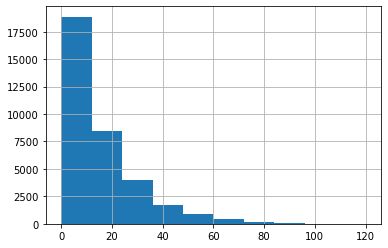

In [26]:
speeds_merged['diff'].hist(range=[0,120])

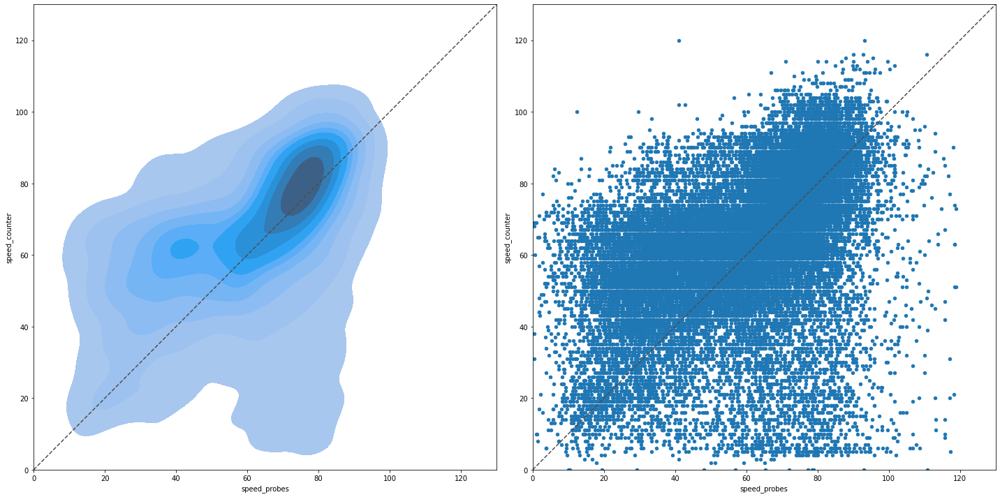

In [27]:
plot_scatters(speeds_merged)

<AxesSubplot:>

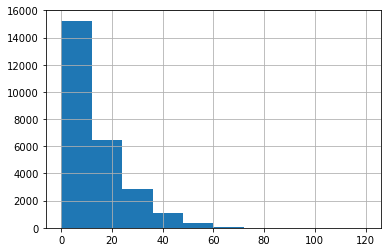

In [28]:
speeds_merged_day = speeds_merged[(speeds_merged['t'] > 23) & (speeds_merged['t'] < 92)]
speeds_merged_day['diff'].hist(range=[0,120])

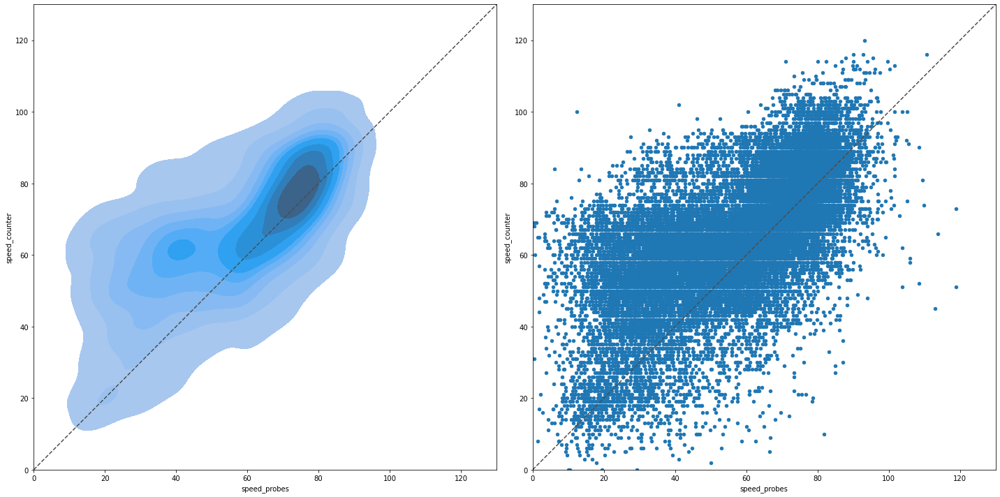

In [29]:
plot_scatters(speeds_merged_day)

The difference of the kde plot in comparison to London can be explained. Madrid counters are all inner-city while in London we have speeds only on the highways on the ring around the city. Hence speeds measured by counters in Madrid are lower and affected more often by traffic lights etc.

Area (x in (0, 120), y in (0, 120) contains 34498 / 34505 readings (99.98%)
Readings are on 404 / 404 locations


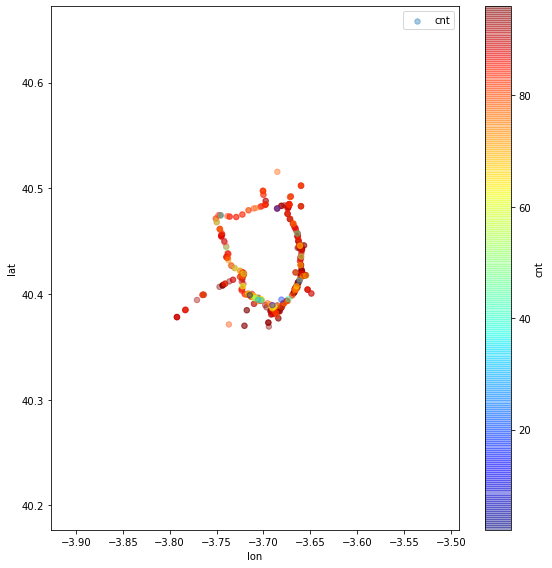

In [30]:
_ = inspect_diff_area(speeds_merged, 0, 120, 0, 120, bbox_city='madrid')

In [31]:
speeds_merged.to_parquet(COUNTER_PATH / 'madrid' / 'speeds_merged_madrid.parquet', compression="snappy")

Area (x in (0, 120), y in (0, 120) contains 34498 / 34505 readings (99.98%)
Readings are on 404 / 404 locations


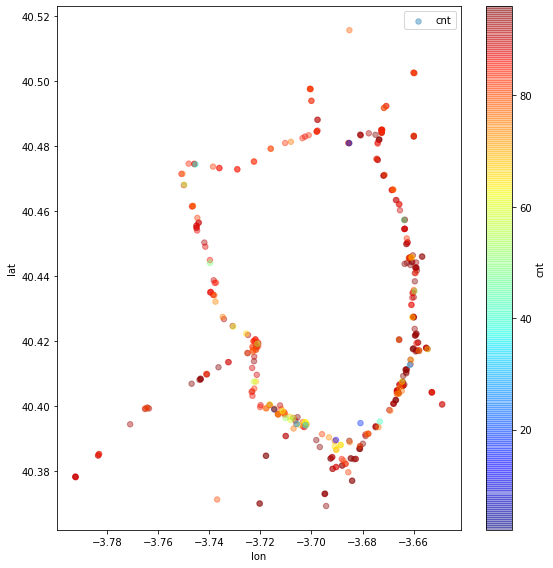

In [32]:
_ = inspect_diff_area(speeds_merged, 0, 120, 0, 120)

Area (x in (40, 120), y in (0, 15) contains 584 / 34505 readings (1.69%)
Readings are on 190 / 404 locations


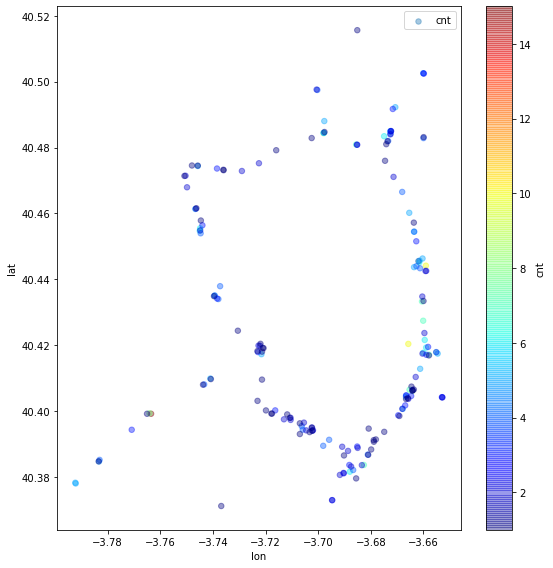

,id,lat,lon,cnt
156,7012,40.399210,-3.763501,15
29,3539,40.444152,-3.659062,10
53,6658,40.445483,-3.661806,10
47,3827,40.420407,-3.665741,10
101,6795,40.399371,-3.764094,8
...,...,...,...,...
18,1038,40.409574,-3.721354,1
151,6943,40.384766,-3.783417,1
24,1052,40.403674,-3.666589,1
1,1002,40.408030,-3.743760,1


In [33]:
inspect_diff_area(speeds_merged, 40, 120, 0, 15)

In [34]:
speeds_merged['id'].unique()[:5]

array([1001, 1002, 6794, 1003, 1006])

In [35]:
len(speeds_merged['id'].unique())

404

Area (x in (0, 40), y in (80, 120) contains 169 / 26121 readings (0.65%)
Readings are on 30 / 404 locations


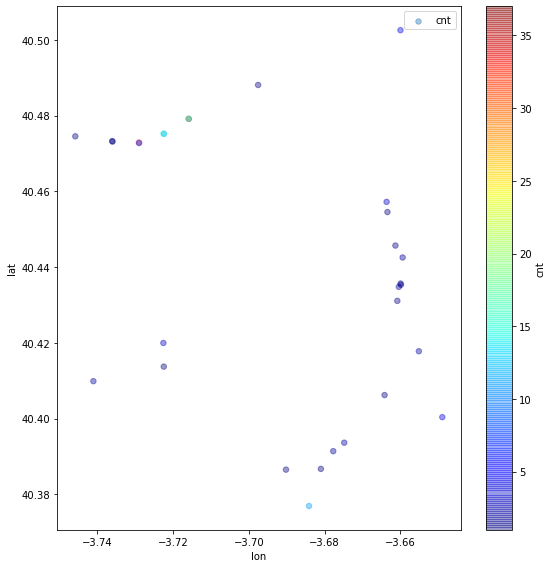

,id,lat,lon,cnt
25,6914,40.479113,-3.715836,37
4,3598,40.472879,-3.728989,31
2,3560,40.479178,-3.715946,16
5,3599,40.475230,-3.722513,16
8,3801,40.475156,-3.722373,12
28,10205,40.376953,-3.684117,11
15,6700,40.472733,-3.728937,6
27,10204,40.400398,-3.648946,4
26,10200,40.502516,-3.659989,4
16,6722,40.457211,-3.663646,3


In [36]:
top_left = inspect_diff_area(speeds_merged_day, 0, 40, 80, 120)
top_left.head(10)

In [37]:
len(speeds_merged_day[speeds_merged_day['id'] == 6699])

68

In [38]:
plot_counter(counters_assigned_df, edges_df, 6700)

In [39]:
plot_counter(counters_assigned_df, edges_df, 3599)

In [40]:
plot_counter(counters_assigned_df, edges_df, 3801)

In [41]:
plot_counter(counters_assigned_df, edges_df, 3560)

In [42]:
plot_counter(counters_assigned_df, edges_df, 6699)

In [43]:
plot_counter(counters_assigned_df, edges_df, 10205)

In [44]:
plot_counter(counters_assigned_df, edges_df, 6699)

So seems tunnels are a problem. Let's have a look at the corresponding segments and the speed distribution:

In [45]:
# edges_df, 3599)
counters_assigned_df[counters_assigned_df['id'] == 3599]

,id,lat,lon,heading,name,ways,way_dists,way,way_dist,u,v,geometry
231,3599,40.47523,-3.722513,239.797328,,"[(339984067, 21682643, 0), (45041881, 33998411...","[5.681283555877961, 9.290834269047307, 21.9580...","[22323496, 22323497, 5778600, 245376524, 24537...",5.681284,339984067,21682643,POINT (-3.72251 40.47523)


Let's find all counters in tunnels

In [48]:
counters_assigned_df['osmid'] = counters_assigned_df['way'].astype(str)
counters_edges_df = counters_assigned_df.merge(edges_df, on=['u', 'v', 'osmid'])
tunnel_counters_df = counters_edges_df[counters_edges_df['tunnel'] == 'yes']
# tunnel_counters_df

In [49]:
tunnel_counter_ids = list(tunnel_counters_df['id'])
print(len(tunnel_counter_ids))
print(tunnel_counter_ids)

230
[1009, 1010, 1011, 1042, 1012, 1045, 6835, 1013, 1014, 1015, 1016, 1017, 1018, 3532, 7123, 1019, 1020, 1021, 1022, 1023, 1024, 1025, 1026, 6869, 6871, 1027, 1028, 4169, 1029, 1030, 6678, 6877, 6893, 1031, 3507, 4703, 1032, 6862, 1033, 6848, 1034, 5275, 5277, 1035, 1036, 1037, 1038, 6840, 1040, 1041, 5191, 1043, 3651, 1044, 1046, 1047, 3650, 6836, 1048, 3491, 3493, 1049, 6898, 1050, 6896, 1052, 3464, 3466, 3487, 3488, 3489, 3495, 3561, 3511, 7019, 7020, 3513, 3515, 3516, 4704, 3539, 3544, 10572, 3545, 3560, 3599, 3564, 3597, 6770, 3637, 3799, 3801, 3837, 3856, 3874, 3878, 9981, 3899, 3950, 4019, 10194, 4048, 4050, 4095, 4096, 4099, 4140, 4141, 4183, 4225, 4313, 4314, 4315, 4316, 10874, 4317, 4318, 4320, 4455, 4587, 4591, 4593, 4595, 4596, 4597, 4601, 4620, 4643, 4728, 4998, 4999, 5010, 5103, 5172, 10223, 10224, 5179, 5216, 5221, 5222, 5223, 5224, 5227, 5317, 5342, 5344, 5348, 5585, 5587, 5616, 5618, 5674, 5755, 5757, 5748, 5768, 5894, 5898, 5895, 5896, 5897, 6149, 6664, 6666, 6684, 

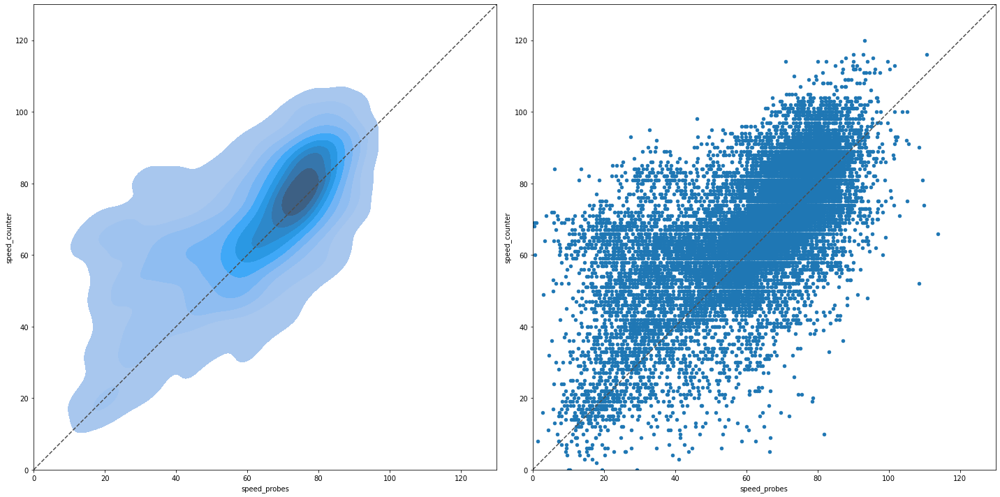

In [50]:
speeds_merged_day_filtered = speeds_merged_day[~speeds_merged_day['id'].isin(tunnel_counter_ids)]
plot_scatters(speeds_merged_day_filtered)

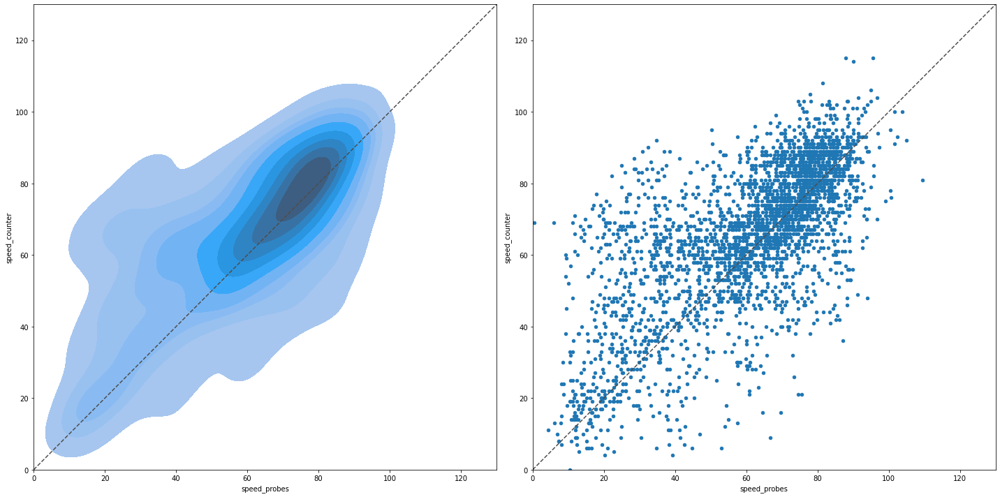

In [51]:
plot_scatters(speeds_merged_day_filtered, 24, 36)  # 6 to 9am

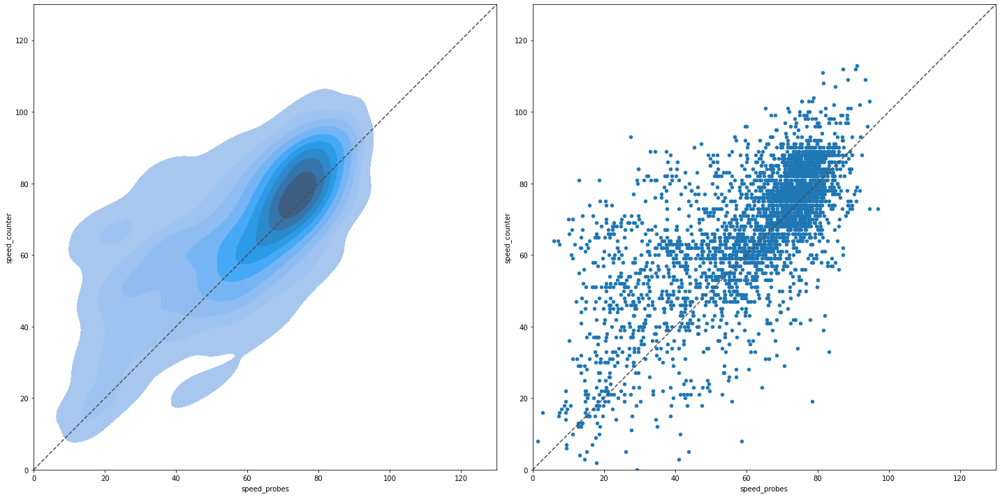

In [52]:
plot_scatters(speeds_merged_day_filtered, 36, 48)  # 9 to 12am

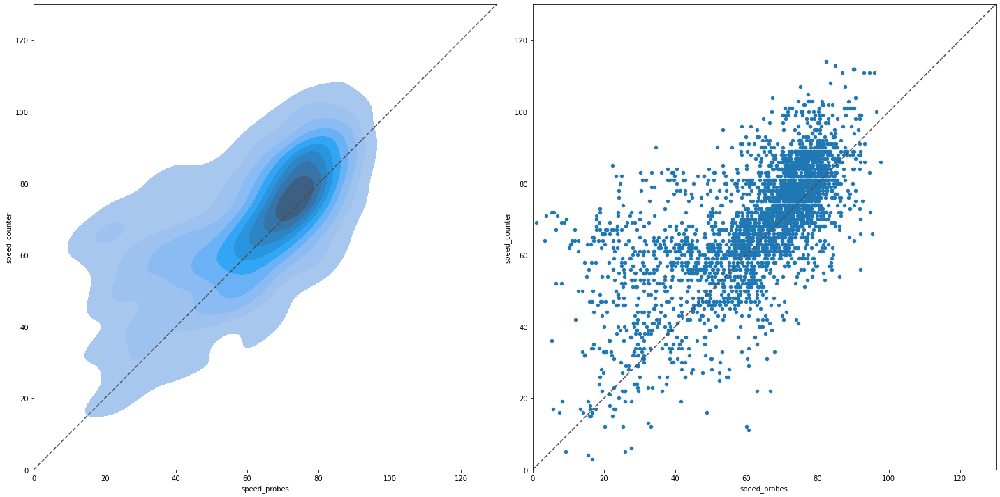

In [53]:
plot_scatters(speeds_merged_day_filtered, 48, 60)  # 12am to 3pm

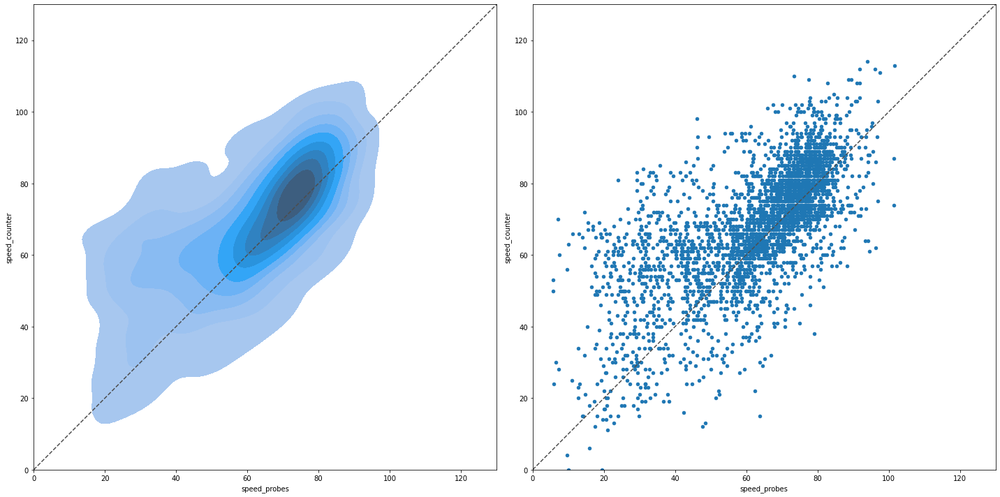

In [54]:
plot_scatters(speeds_merged_day_filtered, 60, 72)  # 3 to 6pm

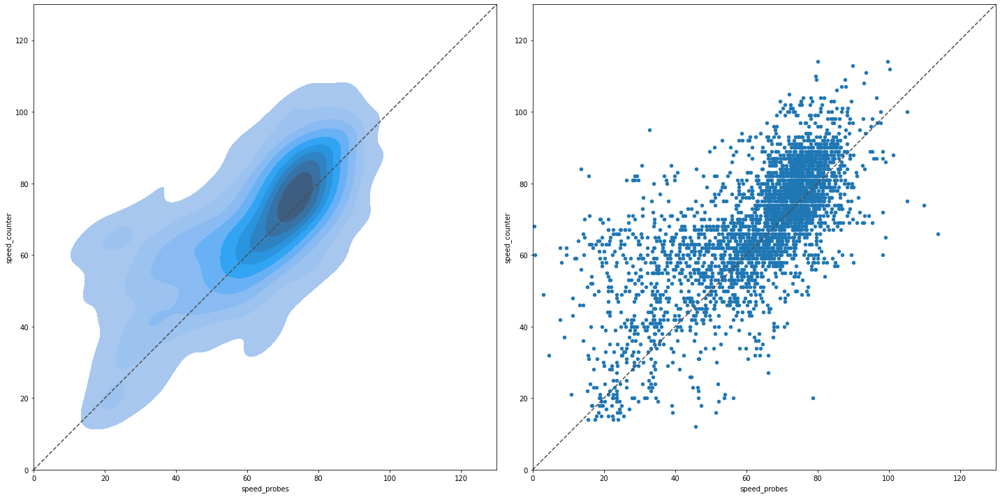

In [55]:
plot_scatters(speeds_merged_day_filtered, 72, 84)  # 6 to 9pm

Find similarities in counters

In [56]:
counters_edges_m30_df = counters_edges_df[counters_edges_df['id'].isin(
    counter_df[counter_df['type'] == 'M30']['id'].unique())]
counters_edges_m30_df = counters_edges_m30_df[~counters_edges_m30_df['id'].isin(tunnel_counter_ids)]
counters_edges_m30_df
# counters_edges_df[counters_edges_df['type'] == 'M30']
# oneway True/False
# length_meters

,id,lat,lon,heading,name,ways,way_dists,way,way_dist,u,...,speed_kph,maxspeed,highway,oneway,lanes,tunnel,length_meters,geometry_y,intersecting_cells,free_flow_kph
0,1001,40.409729,-3.740786,62.428189,,"[(21702026, 315518315, 0), (499633486, 3155183...","[1.4433022167418321, 6.839383661400331, 12.080...",44618925,1.443302,21702026,...,70.0,70,motorway,True,3,nan,525.972,"LINESTRING (-3.74510 40.40749, -3.74416 40.407...","[(262, 186, 0, 0.13444380581776272), (263, 184...",61.647059
1,1002,40.408030,-3.743760,66.768303,,"[(21702026, 315518315, 0), (21702026, 31551770...","[2.209060687018068, 8.790978137683027, 14.2283...",44618925,2.209061,21702026,...,70.0,70,motorway,True,3,nan,525.972,"LINESTRING (-3.74510 40.40749, -3.74416 40.407...","[(262, 186, 0, 0.13444380581776272), (263, 184...",61.647059
2,6794,40.408301,-3.743268,61.302136,,"[(21702026, 315518315, 0), (265977722, 2558833...","[0.37596243735661133, 12.580710837305466, 16.9...",44618925,0.375962,21702026,...,70.0,70,motorway,True,3,nan,525.972,"LINESTRING (-3.74510 40.40749, -3.74416 40.407...","[(262, 186, 0, 0.13444380581776272), (263, 184...",61.647059
3,1003,40.406824,-3.746834,67.775190,,"[(255883289, 21702026, 0), (1425927492, 255883...","[1.9701542307576267, 16.24507476725276, 28.663...",44618924,1.970154,255883289,...,70.0,70,motorway,True,4,nan,531.479,"LINESTRING (-3.75073 40.40538, -3.74834 40.406...","[(266, 176, 0, 0.1301232731100405), (264, 180,...",64.235294
4,1006,40.411894,-3.736324,69.955706,,"[(305399719, 305399717, 0), (315518315, 217020...","[2.76047591158687, 8.549680213918583, 18.87443...",28701928,2.760476,305399719,...,40.0,40,residential,True,1,nan,282.326,"LINESTRING (-3.73848 40.41098, -3.73837 40.411...","[(260, 188, 0, 0.15116388881730455), (260, 189...",60.705882
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3953,10268,40.383707,-3.682701,34.644702,,"[(5023648487, 21716254, 0), (5023648487, 18680...","[2.460530391871141, 9.305734634948458, 24.0705...","[201418137, 201418139, 201418141]",2.460530,5023648487,...,59.2,60,motorway_link,True,"['2', '1']",nan,420.515,"LINESTRING (-3.68391 40.38264, -3.68314 40.383...","[(288, 243, 0, 0.15030241885411671), (286, 244...",82.039216
3971,10297,40.460192,-3.665377,144.220045,,"[(25925497, 25945345, 0), (25925497, 25925622,...","[1.4361126942464637, 11.221358317080893, 15.61...",29144168,1.436113,25925497,...,90.0,90,motorway_link,True,1,nan,286.916,"LINESTRING (-3.66598 40.46126, -3.66550 40.460...","[(213, 262, 2, 0.03631548735205167), (212, 261...",88.705882
4275,10660,40.434018,-3.737925,10.293750,,"[(51397933, 1339912630, 0), (51397933, 2170208...","[3.005072808907086, 12.082625421666599, 24.912...","[6181960, 6181961, 6181962]",3.005073,51397933,...,40.0,40,motorway_link,True,"['1', '2']",nan,298.794,"LINESTRING (-3.73800 40.43380, -3.73796 40.433...","[(237, 190, 2, 0.293938212532362), (238, 189, ...",56.313725
4276,10661,40.433430,-3.659968,12.188487,,"[(321882481, 319775332, 0), (25928496, 2592725...","[0.5140894942299888, 11.373205552898177, 14.15...",29271809,0.514089,321882481,...,50.0,50,motorway_link,True,2,nan,229.578,"LINESTRING (-3.66037 40.43159, -3.66036 40.431...","[(238, 266, 0, 0.14933560712214422), (238, 267...",73.411765


In [58]:
counters_edges_m30_df['highway'] = counters_edges_m30_df['highway'].str.replace(
    '.*motorway_link.*', 'motorway_link', regex=True)

In [60]:
counters_edges_m30_df['highway'].unique()

array(['motorway', 'residential', 'motorway_link', 'trunk', 'primary',
       'trunk_link', 'tertiary_link', "['trunk', 'motorway']", 'tertiary',
       'primary_link'], dtype=object)

motorway (131)
residential (17)
motorway_link (104)
trunk (19)
primary (9)
trunk_link (4)
tertiary_link (3)
['trunk', 'motorway'] (2)
tertiary (1)
primary_link (1)


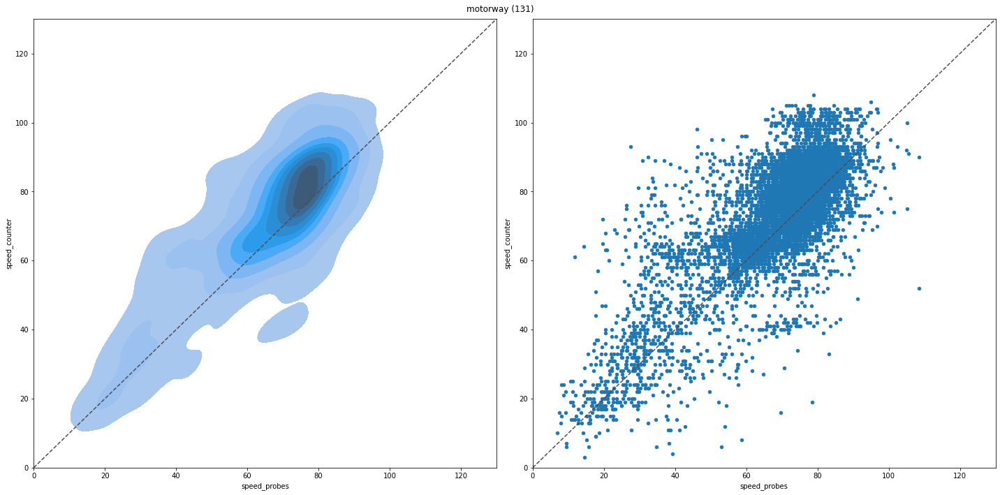

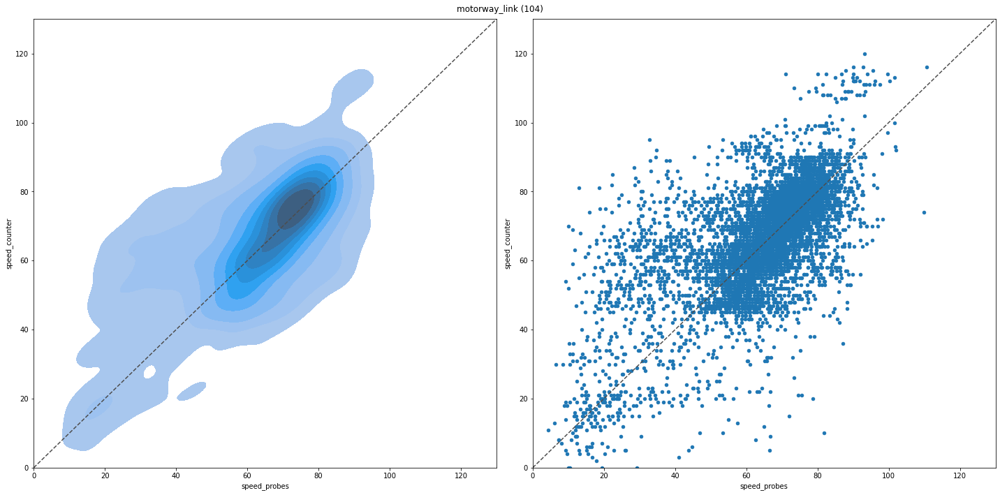

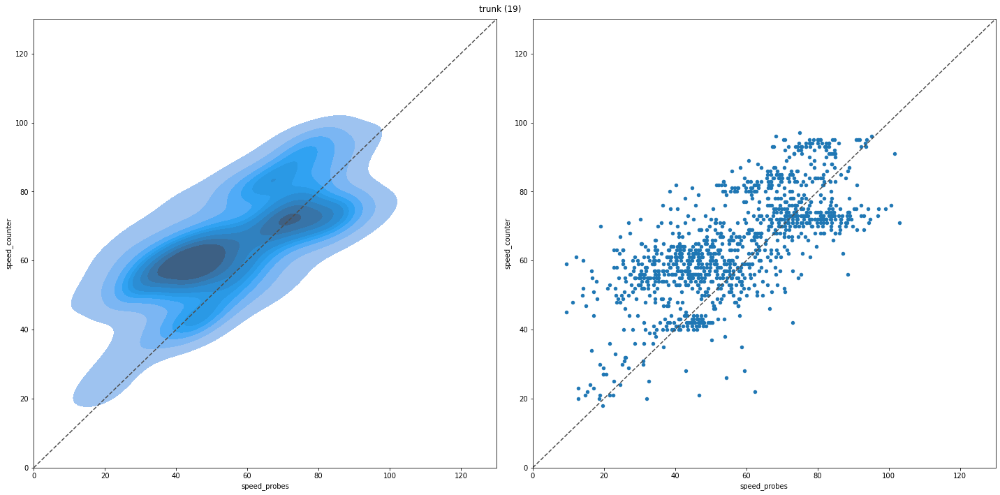

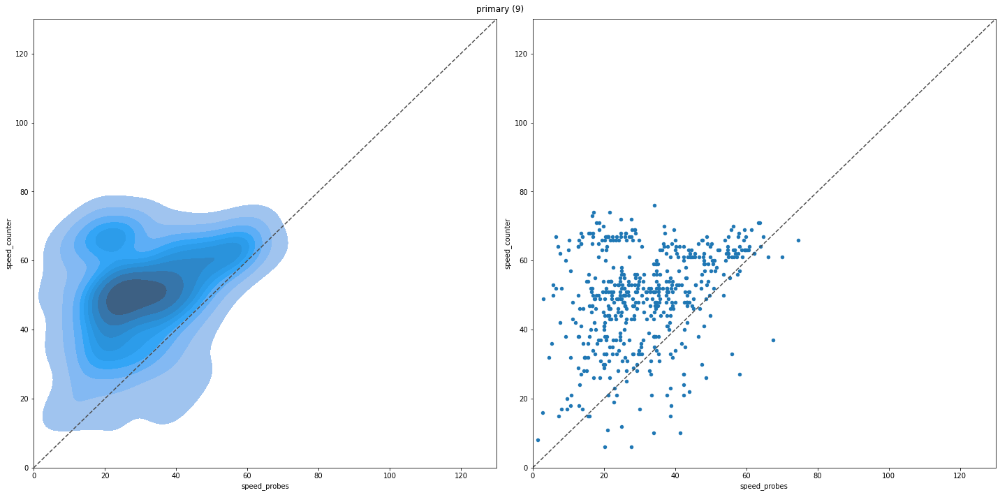

In [61]:
for hw in counters_edges_m30_df['highway'].unique():
    hw_ids = list(counters_edges_m30_df[counters_edges_m30_df['highway'] == hw]['id'])
    num_ids = len(hw_ids)
    print(f'{hw} ({num_ids})')
    if num_ids < 5 or hw in ['residential']:
        continue
    plot_scatters(speeds_merged_day_filtered[speeds_merged_day_filtered['id'].isin(hw_ids)],
                  title=f'{hw} ({len(hw_ids)})')

In [62]:
counters_edges_m30_df[counters_edges_m30_df['highway'] == 'residential']

,id,lat,lon,heading,name,ways,way_dists,way,way_dist,u,...,speed_kph,maxspeed,highway,oneway,lanes,tunnel,length_meters,geometry_y,intersecting_cells,free_flow_kph
4,1006,40.411894,-3.736324,69.955706,,"[(305399719, 305399717, 0), (315518315, 217020...","[2.76047591158687, 8.549680213918583, 18.87443...",28701928,2.760476,305399719,...,40.0,40,residential,True,1,nan,282.326,"LINESTRING (-3.73848 40.41098, -3.73837 40.411...","[(260, 188, 0, 0.15116388881730455), (260, 189...",60.705882
53,1039,40.403120,-3.723050,138.238729,,"[(386236190, 386236202, 0), (599676278, 217800...","[1.6969926440217082, 2.296700201022514, 10.190...","[1047733314, 408629397]",2.296700,599676278,...,76.6,nan,residential,True,1,nan,187.192,"LINESTRING (-3.72331 40.40458, -3.72327 40.403...","[(268, 203, 2, 0.6065740564748668), (267, 203,...",40.000000
224,3542,40.413481,-3.732294,70.410471,,"[(315518315, 21702049, 0), (21702042, 31551839...","[1.6045195966805665, 9.487714866143042, 11.288...",28701928,11.288254,305399716,...,40.0,40,residential,True,1,nan,284.507,"LINESTRING (-3.73413 40.41268, -3.73297 40.413...","[(258, 194, 0, 0.33210651989691836), (258, 195...",61.647059
228,3546,40.409893,-3.740993,242.096508,,"[(1426548713, 1426548692, 0), (1426548713, 265...","[0.8640420281679208, 3.4750414236846354, 4.121...",293920274,0.864042,1426548713,...,76.6,nan,residential,True,nan,nan,254.250,"LINESTRING (-3.74085 40.40994, -3.74118 40.409...","[(262, 184, 3, 0.3412930243367896), (262, 185,...",54.117647
276,3598,40.472879,-3.728989,259.462697,,"[(21682643, 21682639, 0), (43498527, 344863186...","[2.2151758653057447, 15.471605189966642, 18.61...",31014079,15.471605,43498527,...,76.6,nan,residential,True,3,nan,155.780,"LINESTRING (-3.72860 40.47309, -3.72890 40.473...","[(199, 196, 3, 0.22981327683229558), (199, 198...",68.470588
3453,6807,40.480898,-3.685471,180.618745,,"[(21682595, 25908685, 0), (297767512, 25908685...","[1.5438702622957632, 3.8884309423707224, 9.681...",27140252,9.681913,297767512,...,76.6,nan,residential,True,1,nan,189.827,"LINESTRING (-3.68561 40.48149, -3.68557 40.481...","[(190, 241, 3, 0.28641726489710645), (190, 241...",60.078431
3454,6808,40.480900,-3.685574,180.495291,,"[(297767512, 297767075, 0), (297767512, 259086...","[1.0124042382354344, 4.859251034700925, 10.114...",27140252,1.012404,297767512,...,76.6,nan,residential,True,1,nan,189.827,"LINESTRING (-3.68561 40.48149, -3.68557 40.481...","[(190, 241, 3, 0.28641726489710645), (190, 241...",60.078431
3459,6815,40.474322,-3.745341,88.378254,,"[(868736029, 21473125, 0), (21702088, 21473125...","[1.321761198129449, 8.806335295732989, 11.7614...",26471081,13.854536,339997015,...,76.6,nan,residential,False,2,nan,375.996,"LINESTRING (-3.74853 40.47215, -3.74684 40.472...","[(199, 179, 0, 0.26104995387221114), (197, 181...",74.117647
3475,6842,40.407497,-3.721636,17.482646,,"[(6977616158, 21723901, 0), (332053140, 332054...","[2.919741552833861, 13.437225289317452, 28.538...",44887010,28.538391,332054465,...,50.0,50,residential,True,1,nan,91.657,"LINESTRING (-3.72139 40.40767, -3.72129 40.407...","[(264, 205, 0, 0.41391260548867553), (264, 205...",42.823529
3476,6843,40.407472,-3.722485,200.358739,,"[(315523068, 21723907, 0), (332054733, 3320522...","[2.189106022861839, 13.691922242408594]",408629397,13.691922,332054733,...,76.6,nan,residential,True,1,nan,157.835,"LINESTRING (-3.72235 40.40853, -3.72238 40.408...","[(264, 204, 3, 0.6292764956186441), (263, 204,...",48.078431


In [63]:
plot_counter(counters_assigned_df, edges_df, 1006)

In [64]:
counters_edges_m30_df[counters_edges_m30_df['highway'] == 'primary']

,id,lat,lon,heading,name,ways,way_dists,way,way_dist,u,...,speed_kph,maxspeed,highway,oneway,lanes,tunnel,length_meters,geometry_y,intersecting_cells,free_flow_kph
383,3704,40.369168,-3.694259,353.733913,,"[(26191215, 26280683, 0), (26280682, 26280688,...","[2.016677116827541, 12.824364397556032, 36.915...",34562748,2.016677,26191215,...,50.0,50,primary,True,4,nan,218.196,"LINESTRING (-3.69418 40.36877, -3.69422 40.369...","[(302, 232, 0, 0.5124138796523321), (303, 232,...",44.392157
527,3828,40.420478,-3.665708,284.382666,,"[(150554786, 26784156, 0), (3110253479, 311025...","[0.5905137913498728, 8.211398429128845, 16.709...","[15219981, 15219982]",0.590514,150554786,...,50.0,50,primary,True,3,nan,207.375,"LINESTRING (-3.66458 40.42021, -3.66517 40.420...","[(251, 261, 1, 0.4278473347624325), (251, 262,...",65.882353
760,6872,40.390325,-3.693126,296.811853,,"[(388087148, 315239557, 0), (1868858169, 21049...","[4.892093016831308, 16.867425492707916, 28.836...","[131493289, 4336707]",16.867425,1868858169,...,151.3,nan,primary,True,3,nan,221.553,"LINESTRING (-3.69245 40.38977, -3.69263 40.389...","[(281, 233, 1, 0.4734410651704387), (281, 232,...",37.411765
785,6880,40.387531,-3.690863,147.443047,,"[(26396940, 317769138, 0), (317771978, 1247348...","[1.0363231686239336, 7.96512762756579, 12.4888...","[398415916, 43681566]",1.036323,26396940,...,50.0,50,primary,True,"['4', '2']",nan,134.652,"LINESTRING (-3.69144 40.38850, -3.69123 40.388...","[(284, 236, 2, 0.3162195526491086), (284, 235,...",43.058824
1562,10211,40.371212,-3.736837,48.708637,,"[(316228578, 22561247, 0), (1329856671, 204850...","[1.177691643410552, 12.734263851250494]","[23951790, 60769710]",1.177692,316228578,...,50.0,50,primary,True,3,nan,405.926,"LINESTRING (-3.73733 40.37081, -3.73721 40.370...","[(301, 189, 0, 0.07120517783741), (300, 191, 0...",47.764706
1724,6886,40.388041,-3.688472,228.765316,,"[(317771978, 317771975, 0), (317771984, 364737...","[2.3245921070467648, 3.837721334140387, 5.0331...",816555265,9.448639,317771984,...,151.3,nan,primary,True,2,nan,446.615,"LINESTRING (-3.68652 40.38983, -3.68692 40.389...","[(283, 239, 3, 0.13878787908444234), (282, 239...",44.941176
1725,6887,40.387934,-3.688650,228.765155,,"[(317771984, 364737377, 0), (317771978, 317771...","[0.1464520420445902, 4.588136995288055, 6.1533...",816555265,6.153370,317771984,...,151.3,nan,primary,True,2,nan,446.615,"LINESTRING (-3.68652 40.38983, -3.68692 40.389...","[(283, 239, 3, 0.13878787908444234), (282, 239...",44.941176
3327,6667,40.420287,-3.665656,103.694509,,"[(26784155, 150985405, 0), (8640076086, 150985...","[1.4437161554335112, 9.990639833420044, 10.633...",656037727,1.443716,26784155,...,50.0,50,primary,True,4,nan,39.598,"LINESTRING (-3.66584 40.42036, -3.66541 40.42022)","[(251, 261, 2, 1.0)]",63.372549
3511,6895,40.394707,-3.680809,246.593740,,"[(248941210, 248938232, 0), (3514716613, 35147...","[2.047769527437135, 4.398186207954259, 8.56513...","[344727432, 881677578, 197690133]",2.047770,248941210,...,151.3,nan,primary,True,2,nan,271.703,"LINESTRING (-3.67998 40.39499, -3.68008 40.394...","[(276, 247, 3, 0.0), (277, 244, 3, 0.094767874...",34.823529


In [65]:
plot_counter(counters_assigned_df, edges_df, 10211)

good counters: 150


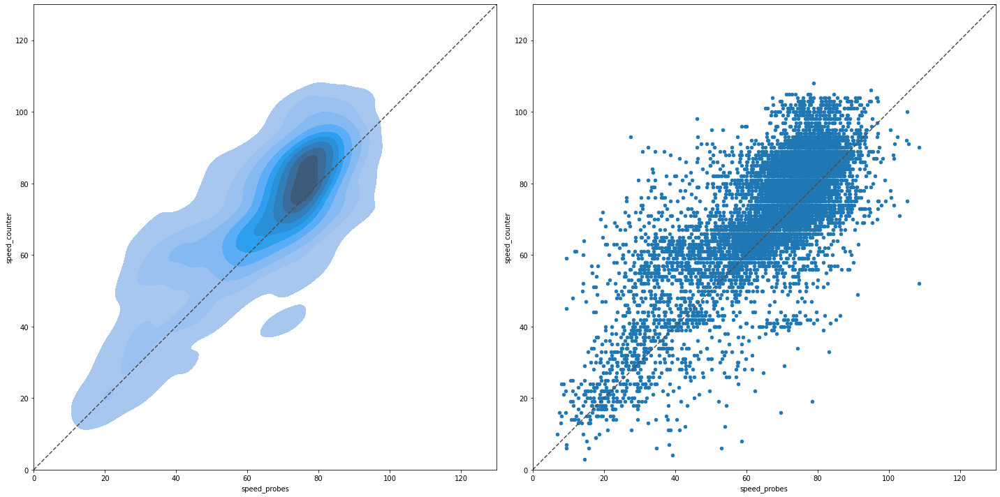

In [66]:
good_ids = list(counters_edges_m30_df[counters_edges_m30_df['highway'] == 'motorway']['id'])
good_ids.extend(list(counters_edges_m30_df[counters_edges_m30_df['highway'] == 'trunk']['id']))
print(f'good counters: {len(good_ids)}')
plot_scatters(speeds_merged_day_filtered[speeds_merged_day_filtered['id'].isin(good_ids)])

Area (x in (0, 40), y in (80, 120) contains 14 / 9132 readings (0.15%)
Readings are on 8 / 142 locations


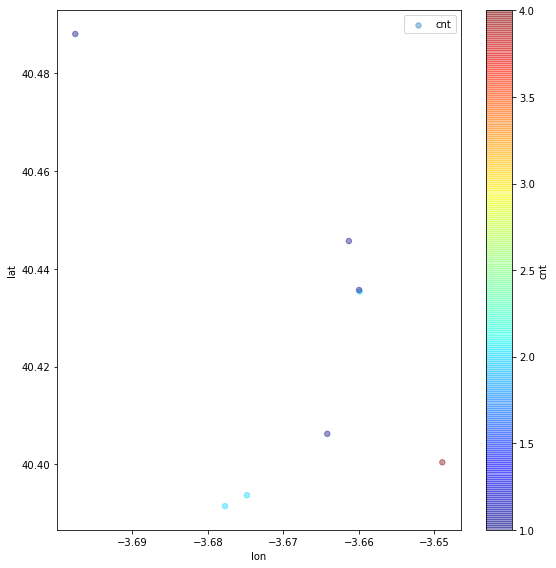

,id,lat,lon,cnt
7,10204,40.400398,-3.648946,4
3,6679,40.393664,-3.674823,2
4,6682,40.391422,-3.677719,2
5,6732,40.435325,-3.659859,2
0,3600,40.406225,-3.664178,1
1,3820,40.435670,-3.659971,1
2,6656,40.445681,-3.661320,1
6,6802,40.488059,-3.697541,1


In [67]:
good_top_left = inspect_diff_area(
    speeds_merged_day_filtered[speeds_merged_day_filtered['id'].isin(good_ids)], 0, 40, 80, 120)
good_top_left.head(10)

In [68]:
plot_counter(counters_assigned_df, edges_df, 6700)
# probably too close to tunnel

In [69]:
plot_counter(counters_assigned_df, edges_df, 3560)
# probably also too close to tunnel

In [70]:
plot_counter(counters_assigned_df, edges_df, 6952)
# maybe caused by the gas or bus station

good counters: 150


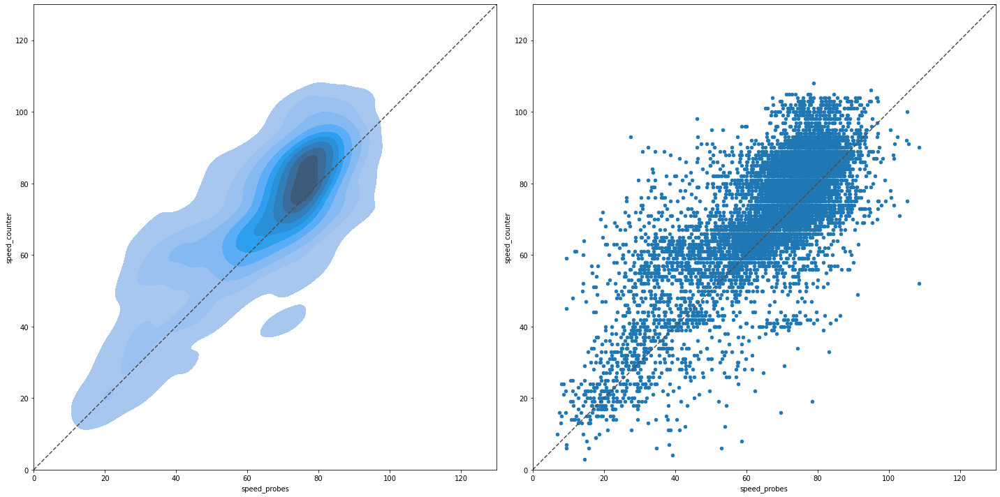

In [72]:
# let's remove the two near-tunnels
# good_ids.remove(6700)
# good_ids.remove(3560)
print(f'good counters: {len(good_ids)}')
speeds_merged_day_filtered_good = speeds_merged_day_filtered[speeds_merged_day_filtered['id'].isin(good_ids)]
plot_scatters(speeds_merged_day_filtered_good)

In [73]:
speeds_merged_day_filtered_good.to_parquet(
    COUNTER_PATH / 'madrid' / 'speeds_merged_clean_madrid.parquet', compression="snappy")

Now the above looks nice, the three upper bumps seem to be a combination of space/time mean and speed limits!


Let's do some stats: how many diffs are +-10%

9132
4969
6593
7548
8089


<ipython-input-75-36ea2929da3c>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  good_speeds_merged['pdiff'] = good_speeds_merged['diff'] / good_speeds_merged['free_flow_kph'] * 100


<AxesSubplot:>

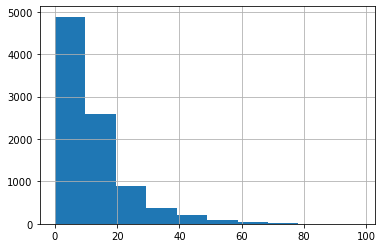

In [75]:
good_speeds_merged = speeds_merged_day_filtered[speeds_merged_day_filtered['id'].isin(good_ids)]
print(len(good_speeds_merged))
good_speeds_merged['pdiff'] = good_speeds_merged['diff'] / good_speeds_merged['free_flow_kph'] * 100
print(len(good_speeds_merged[good_speeds_merged['pdiff'] < 10]))
print(len(good_speeds_merged[good_speeds_merged['pdiff'] < 15]))
print(len(good_speeds_merged[good_speeds_merged['pdiff'] < 20]))
print(len(good_speeds_merged[good_speeds_merged['pdiff'] < 25]))
good_speeds_merged['pdiff'].hist()

Continue with the remaining large diffs:

In [76]:
speeds_merged_day[speeds_merged_day['diff'] > 50]

,id,lat,lon,heading,time_bin,type,volume,occupation,congestion_level,speed_counter,...,v,gkey,osmid,volume_class,volume_probes,speed_probes,mean_speed_kph,std_speed_kph,free_flow_kph,diff
1138,1013,40.419971,-3.722532,150.423463,2021-06-01 06:15,M30,828,0.0,0.0,89.0,...,315259372,7488239431673385883,27267182,5,11.0,32.000000,50.666667,34.337538,62.745098,57.000000
1148,1013,40.419971,-3.722532,150.423463,2021-06-01 07:30,M30,1836,3.0,0.0,81.0,...,315259372,7488239431673385883,27267182,5,5.0,24.470588,24.470588,2.823529,62.745098,56.529412
1168,1013,40.419971,-3.722532,150.423463,2021-06-01 10:00,M30,2328,5.0,0.0,72.0,...,315259372,7488239431673385883,27267182,5,45.0,3.764706,11.294118,12.138785,62.745098,68.235294
1204,1013,40.419971,-3.722532,150.423463,2021-06-01 14:30,M30,3612,9.0,0.0,67.0,...,315259372,7488239431673385883,27267182,5,17.0,11.450980,23.725490,23.339726,62.745098,55.549020
1206,1013,40.419971,-3.722532,150.423463,2021-06-01 14:45,M30,3480,8.0,0.0,70.0,...,315259372,7488239431673385883,27267182,5,9.0,6.901961,37.124183,44.302611,62.745098,63.098039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36809,10266,40.434783,-3.660423,191.350134,2021-06-01 10:15,M30,1156,4.0,35.0,75.0,...,25531168,4140635224822152835,"[371748832, 246709234, 4298495]",5,216.0,20.470588,39.912854,29.943429,80.313725,54.529412
36811,10266,40.434783,-3.660423,191.350134,2021-06-01 10:45,M30,1201,4.0,36.0,75.0,...,25531168,4140635224822152835,"[371748832, 246709234, 4298495]",5,283.0,18.784314,35.105882,30.504021,80.313725,56.215686
36819,10266,40.434783,-3.660423,191.350134,2021-06-01 12:45,M30,1137,5.0,34.0,76.0,...,25531168,4140635224822152835,"[371748832, 246709234, 4298495]",5,222.0,24.196078,37.850980,29.736129,80.313725,51.803922
36823,10266,40.434783,-3.660423,191.350134,2021-06-01 13:45,M30,1275,5.0,39.0,78.0,...,25531168,4140635224822152835,"[371748832, 246709234, 4298495]",5,249.0,24.156863,40.191721,27.667274,80.313725,53.843137


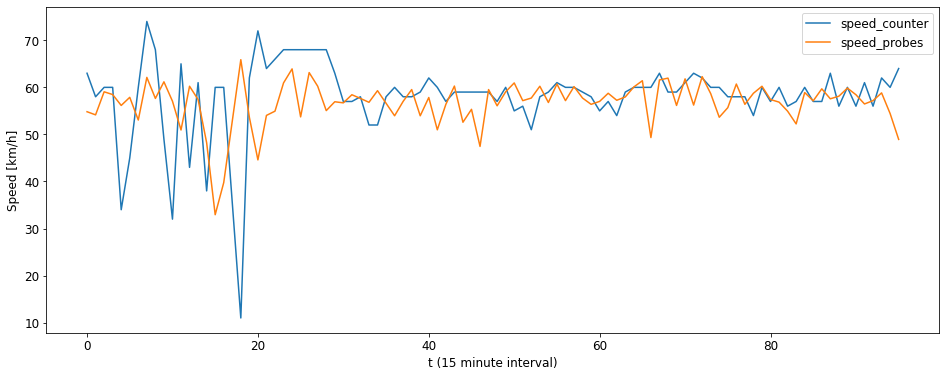

In [74]:
plot_speed_dayline(speeds_merged, 1001)

In [77]:
plot_counter(counters_assigned_df, edges_df, 1001)

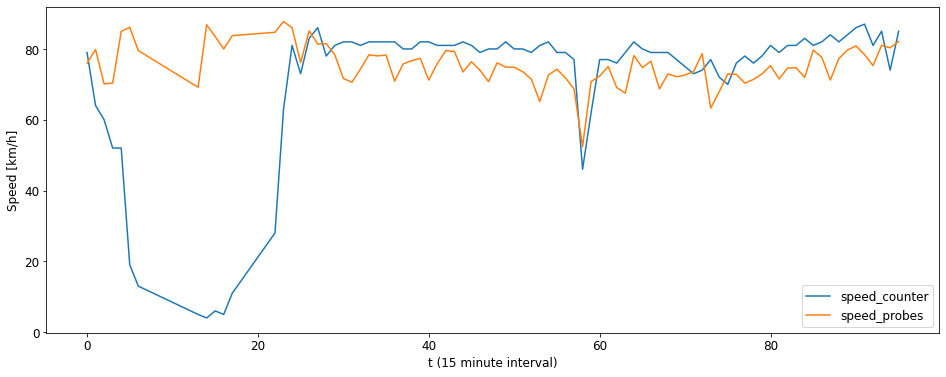

In [78]:
plot_speed_dayline(speeds_merged, 10662)

In [80]:
plot_counter(counters_assigned_df, edges_df, 10662)

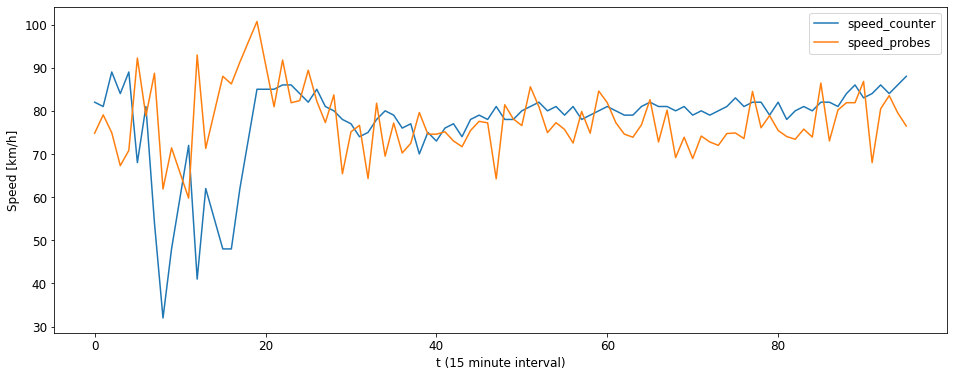

In [79]:
plot_speed_dayline(speeds_merged, 6693)

In [81]:
plot_counter(counters_assigned_df, edges_df, 6693)

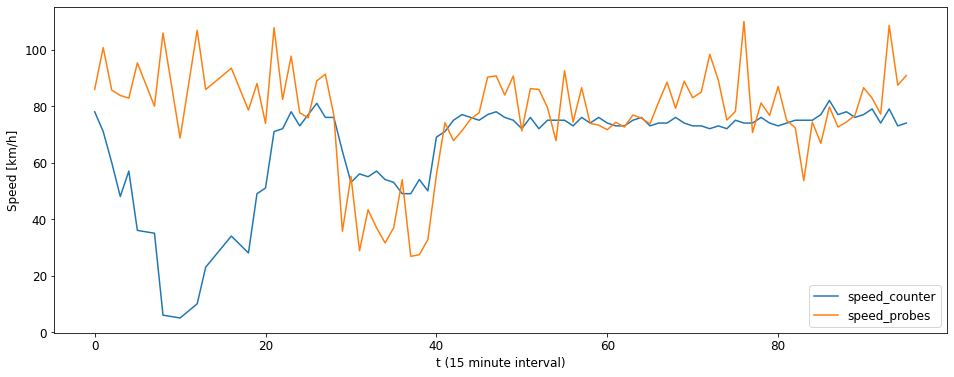

In [82]:
plot_speed_dayline(speeds_merged, 7131)

In [83]:
plot_counter(counters_assigned_df, edges_df, 7131)

# Compare Flow Values

In [70]:
counter_flow_df = counter_df[counter_df['type'] != 'M30']
counter_flow_df

,id,lat,lon,heading,time_bin,type,volume,occupation,congestion_level,speed_counter,t,day
128259,3395,40.442836,-3.709570,311.591896,2021-06-01 00:00,URB,77,1.0,5.0,0.0,95,2021-05-31
128260,3395,40.442836,-3.709570,311.591896,2021-06-01 00:15,URB,86,2.0,5.0,0.0,0,2021-06-01
128261,3395,40.442836,-3.709570,311.591896,2021-06-01 00:30,URB,54,1.0,4.0,0.0,1,2021-06-01
128262,3395,40.442836,-3.709570,311.591896,2021-06-01 00:45,URB,94,3.0,7.0,0.0,2,2021-06-01
128263,3395,40.442836,-3.709570,311.591896,2021-06-01 01:00,URB,50,1.0,3.0,0.0,3,2021-06-01
...,...,...,...,...,...,...,...,...,...,...,...,...
11577333,10814,40.399327,-3.687896,93.335224,2021-06-30 22:45,URB,285,3.0,12.0,0.0,90,2021-06-30
11577334,10814,40.399327,-3.687896,93.335224,2021-06-30 23:00,URB,228,2.0,9.0,0.0,91,2021-06-30
11577335,10814,40.399327,-3.687896,93.335224,2021-06-30 23:15,URB,228,2.0,10.0,0.0,92,2021-06-30
11577336,10814,40.399327,-3.687896,93.335224,2021-06-30 23:30,URB,256,2.0,11.0,0.0,93,2021-06-30


In [71]:
counter_flows_oneday = counter_flow_df[counter_flow_df['day'] == '2021-06-01'].merge(
    counters_assigned_df[['id', 'way', 'u', 'v']], on=['id'])
counter_flows_oneday

,id,lat,lon,heading,time_bin,type,volume,occupation,congestion_level,speed_counter,t,day,way,u,v
0,3395,40.442836,-3.709570,311.591896,2021-06-01 00:15,URB,86,2.0,5.0,0.0,0,2021-06-01,43407391,6277264493,27519777
1,3395,40.442836,-3.709570,311.591896,2021-06-01 00:30,URB,54,1.0,4.0,0.0,1,2021-06-01,43407391,6277264493,27519777
2,3395,40.442836,-3.709570,311.591896,2021-06-01 00:45,URB,94,3.0,7.0,0.0,2,2021-06-01,43407391,6277264493,27519777
3,3395,40.442836,-3.709570,311.591896,2021-06-01 01:00,URB,50,1.0,3.0,0.0,3,2021-06-01,43407391,6277264493,27519777
4,3395,40.442836,-3.709570,311.591896,2021-06-01 01:15,URB,72,1.0,5.0,0.0,4,2021-06-01,43407391,6277264493,27519777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
342121,10801,40.505458,-3.694589,295.405985,2021-06-01 23:00,URB,10,0.0,2.0,0.0,91,2021-06-01,29026098,3392462482,3392530576
342122,10801,40.505458,-3.694589,295.405985,2021-06-01 23:15,URB,5,0.0,1.0,0.0,92,2021-06-01,29026098,3392462482,3392530576
342123,10801,40.505458,-3.694589,295.405985,2021-06-01 23:30,URB,0,0.0,0.0,0.0,93,2021-06-01,29026098,3392462482,3392530576
342124,10801,40.505458,-3.694589,295.405985,2021-06-01 23:45,URB,9,0.0,1.0,0.0,94,2021-06-01,29026098,3392462482,3392530576


In [72]:
len(counter_flows_oneday['id'].unique())

3798

In [73]:
list(counter_flows_oneday['id'].unique())[1000:1010]

[4587, 4588, 4589, 4590, 4591, 4592, 4593, 4594, 4595, 4596]

In [74]:
list(counter_flows_oneday[counter_flows_oneday['volume'] > 3000]['id'].unique())

[3691,
 3716,
 4113,
 4135,
 4173,
 4419,
 4437,
 4444,
 4462,
 4822,
 4829,
 5457,
 7018,
 7021,
 7136,
 7138,
 7139,
 9977,
 10395,
 10397,
 10674]

In [75]:
flows_merged = counter_flows_oneday.merge(speed_df, on=['u', 'v', 't', 'day'])
flows_merged

,id,lat,lon,heading,time_bin,type,volume,occupation,congestion_level,speed_counter,t,day,way,u,v,gkey,volume_class,speed_probes,free_flow_kph
0,3395,40.442836,-3.709570,311.591896,2021-06-01 01:00,URB,50,1.0,3.0,0.0,3,2021-06-01,43407391,6277264493,27519777,-9181695695839057484,5,29.529412,37.647059
1,3395,40.442836,-3.709570,311.591896,2021-06-01 01:15,URB,72,1.0,5.0,0.0,4,2021-06-01,43407391,6277264493,27519777,-9181695695839057484,5,21.176471,37.647059
2,3395,40.442836,-3.709570,311.591896,2021-06-01 02:30,URB,24,0.0,2.0,0.0,9,2021-06-01,43407391,6277264493,27519777,-9181695695839057484,5,32.941176,37.647059
3,3395,40.442836,-3.709570,311.591896,2021-06-01 05:45,URB,36,1.0,2.0,0.0,22,2021-06-01,43407391,6277264493,27519777,-9181695695839057484,5,56.470588,37.647059
4,3395,40.442836,-3.709570,311.591896,2021-06-01 06:45,URB,89,1.0,5.0,0.0,26,2021-06-01,43407391,6277264493,27519777,-9181695695839057484,3,17.176471,37.647059
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216921,10801,40.505458,-3.694589,295.405985,2021-06-01 12:15,URB,35,1.0,4.0,0.0,48,2021-06-01,29026098,3392462482,3392530576,928591678630827926,5,16.000000,21.882353
216922,10801,40.505458,-3.694589,295.405985,2021-06-01 12:30,URB,37,1.0,5.0,0.0,49,2021-06-01,29026098,3392462482,3392530576,928591678630827926,5,12.470588,21.882353
216923,10801,40.505458,-3.694589,295.405985,2021-06-01 13:15,URB,26,0.0,2.0,0.0,52,2021-06-01,29026098,3392462482,3392530576,928591678630827926,5,18.588235,21.882353
216924,10801,40.505458,-3.694589,295.405985,2021-06-01 14:00,URB,51,0.0,4.0,0.0,55,2021-06-01,29026098,3392462482,3392530576,928591678630827926,5,6.588235,21.882353


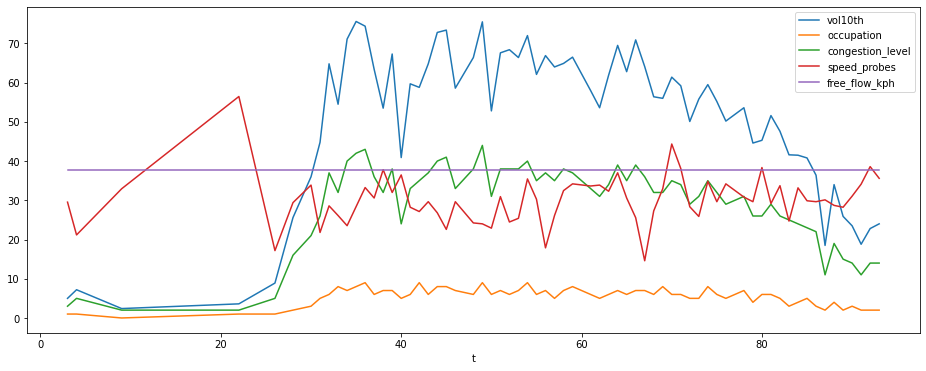

In [76]:
plot_flow_dayline(flows_merged, 3395)

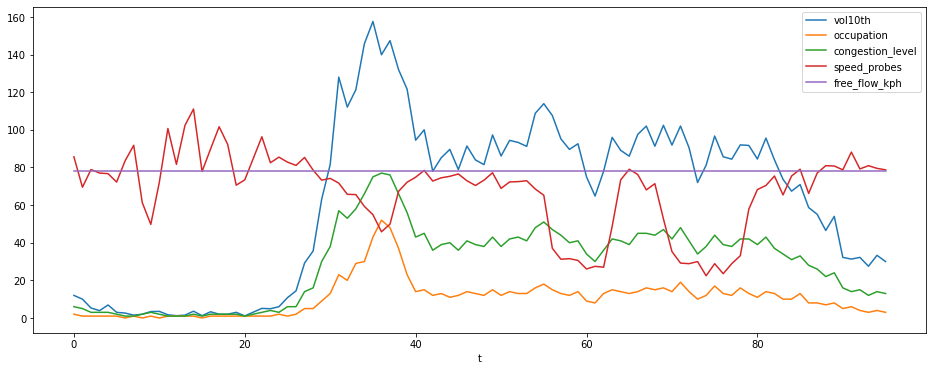

In [77]:
plot_flow_dayline(flows_merged, 3414)

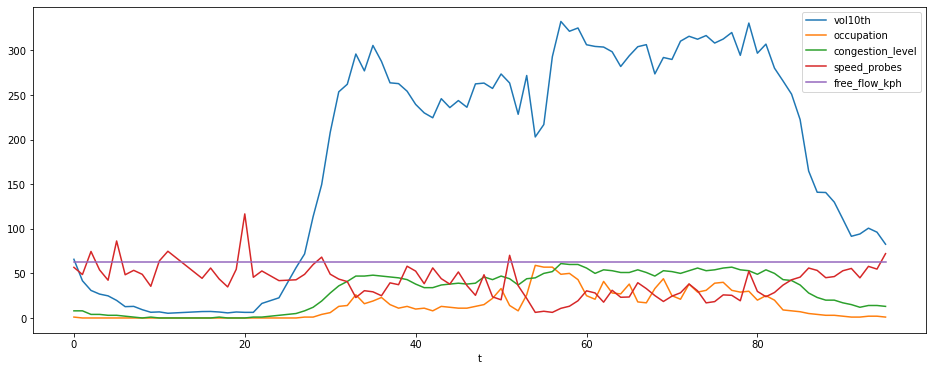

In [78]:
plot_flow_dayline(flows_merged, 7018)

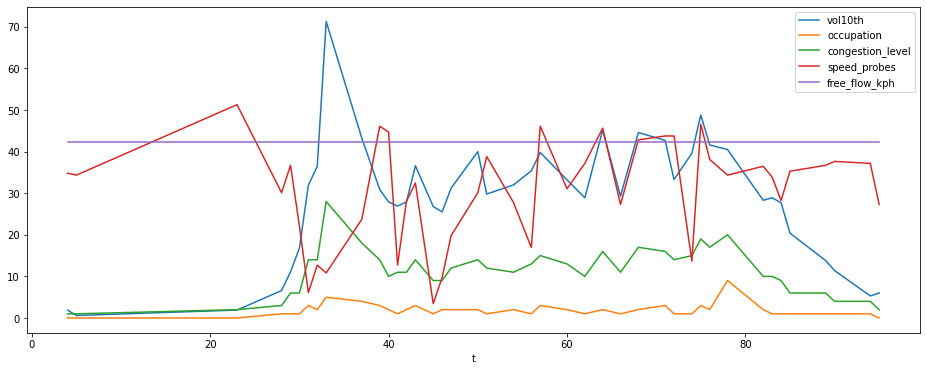

In [79]:
plot_flow_dayline(flows_merged, 10799)

In [80]:
def speed_hist(s):
    h = np.histogram(s, bins=6)
    return h
    return h[-1][-1]


speed_hists = flows_merged[flows_merged['speed_probes'] > 0][['id', 'speed_probes']]
speed_hists = speed_hists.groupby(by=['id']).agg(list).reset_index()
speed_hists['shist'] = [speed_hist(s) for s in speed_hists['speed_probes']]
print(speed_hists[speed_hists['id'] == 3402]['shist'].values[0])
speed_hists[speed_hists['id'] == 3402]

(array([ 5,  0,  5, 34, 20,  6]), array([ 3.92156863, 11.03267974, 18.14379085, 25.25490196, 32.36601307,
       39.47712418, 46.58823529]))


,id,speed_probes,shist
7,3402,"[40.0, 27.764705882352942, 31.058823529411768,...","([5, 0, 5, 34, 20, 6], [3.9215686274509807, 11..."


In [81]:
plot_counter(counters_assigned_df, edges_df, 3677)

/usr/local/Caskroom/miniconda/base/envs/t4c/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


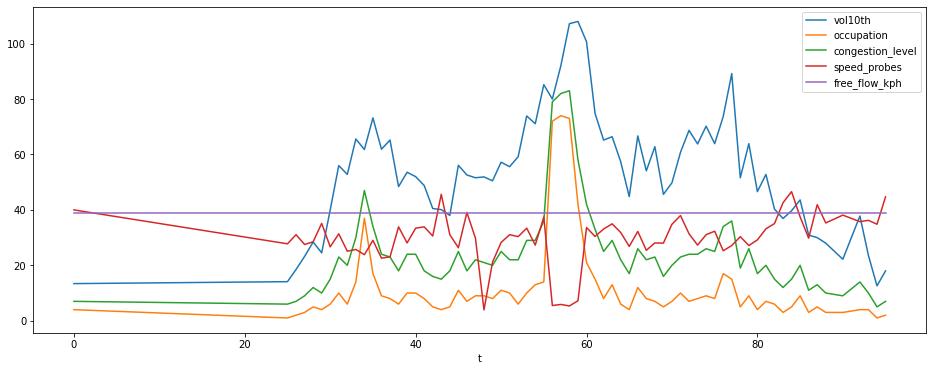

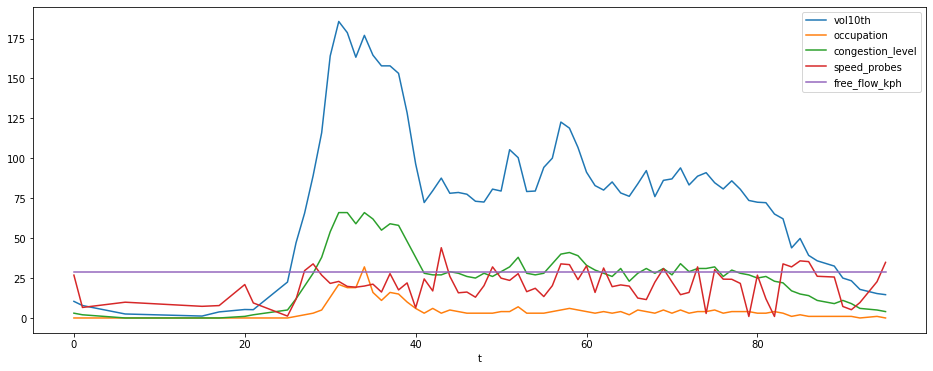

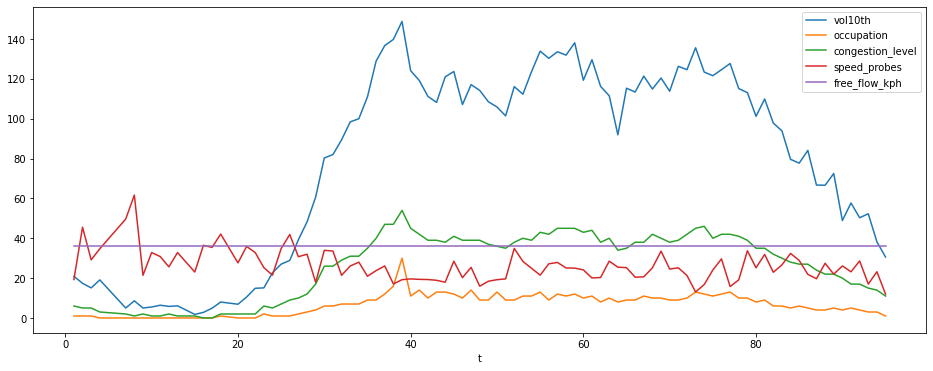

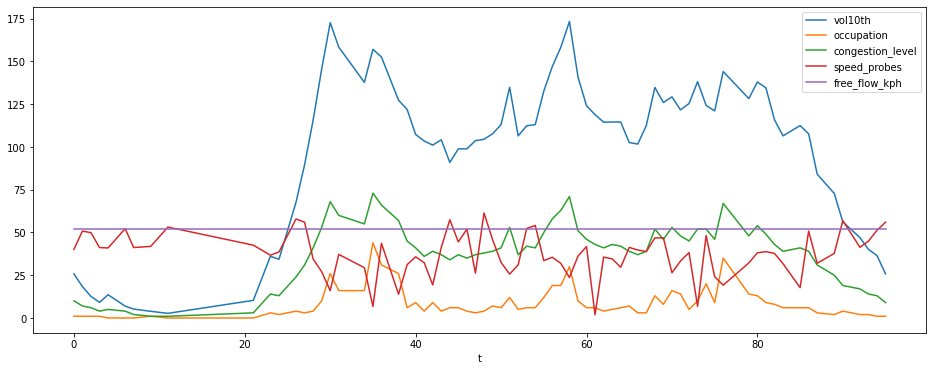

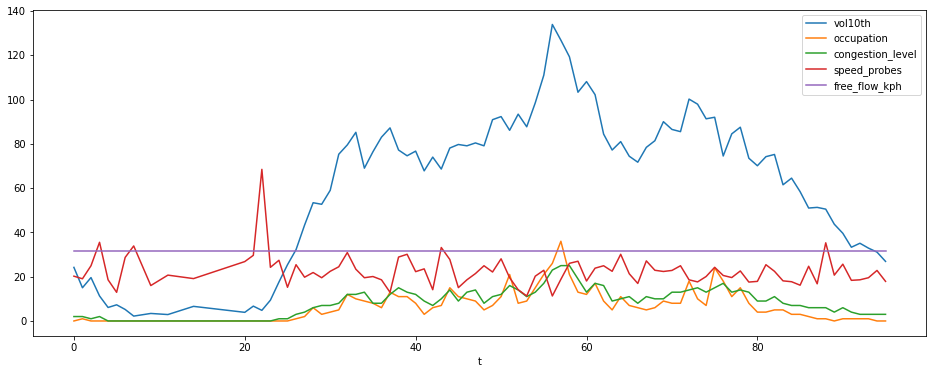

...

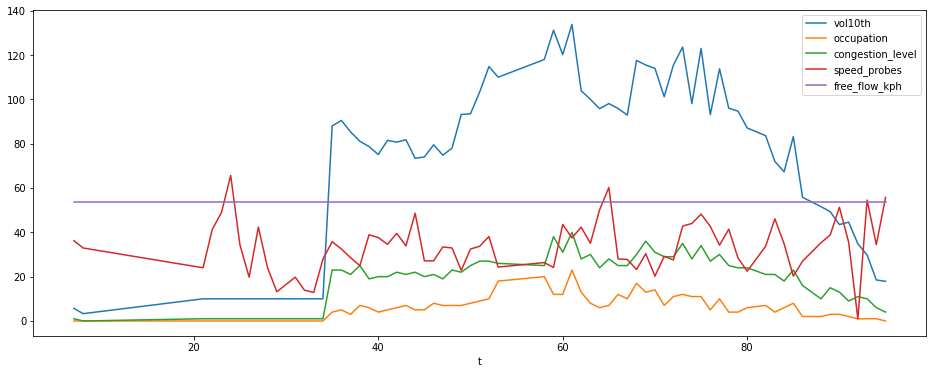

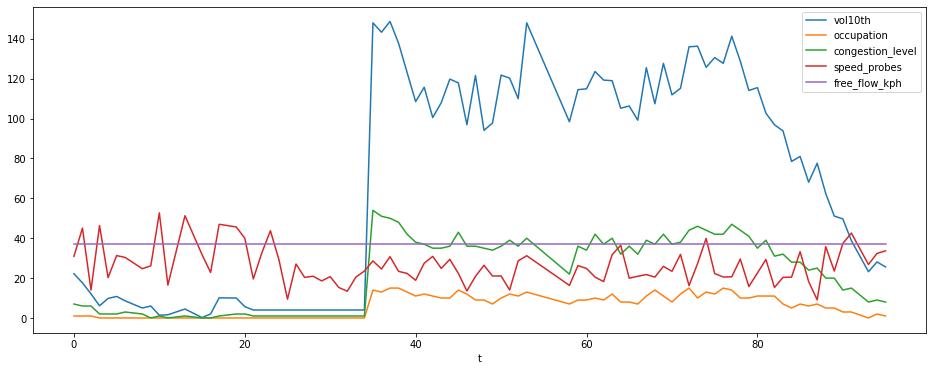

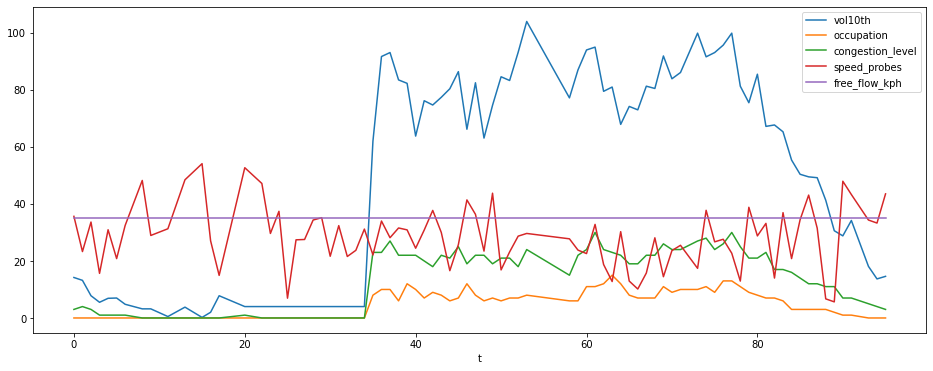

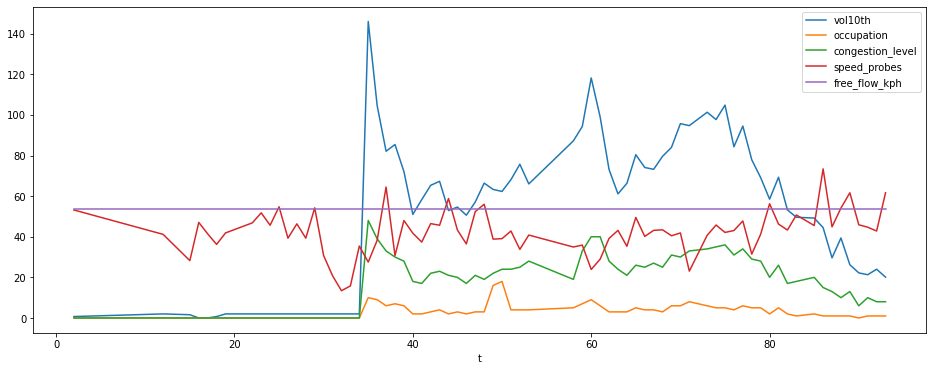

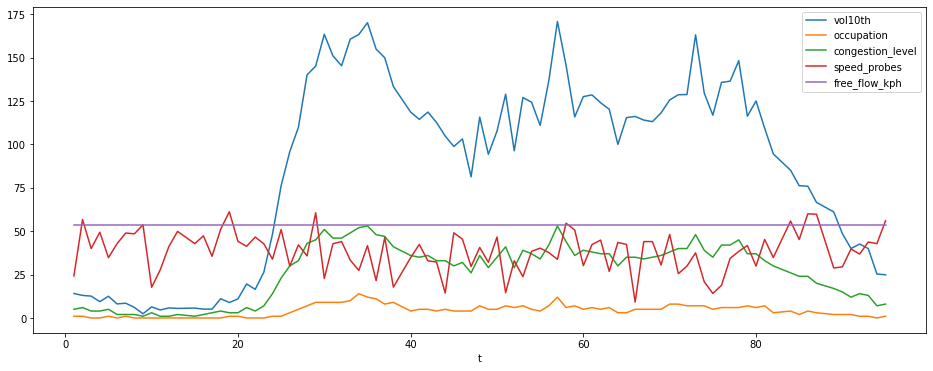

In [82]:
for id in list(flows_merged[flows_merged['volume'] > 1000]['id'].unique())[::10]:
    plot_flow_dayline(flows_merged, id)